<a href="https://colab.research.google.com/github/atikhasan007/Computer-Vision/blob/main/Custom_object_detection_using_detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# install Detectrion2 Dependencies

In [7]:
# Install dependency
!pip install pyyaml==5.1


  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [8]:
import torch

TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]

print("torch:", TORCH_VERSION, "; cuda:", CUDA_VERSION)


torch: 2.9 ; cuda: cu126


In [9]:
# Install detectron2 matching your torch + cuda version
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu{CUDA_VERSION}/torch{TORCH_VERSION}/index.html


Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cucu126/torch2.9/index.html


In [10]:
# If above fails, use source install
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'


  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-z2rv5hp5
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-z2rv5hp5
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (setup.py) ... done


In [11]:
# Restart runtime after install
exit(0)


In [1]:
import detectron2
print(detectron2.__version__)


0.6


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="iH4CHk613cpvkxfKvcej")
project = rf.workspace("pavan-kalyan-o41rw").project("person_detection-vak5r")
version = project.version(1)
dataset = version.download("coco")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to person_detection-1 in coco:: 100%|██████████| 3097/3097 [00:03<00:00, 1005.42it/s]


In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train",{},"/content/person_detection-1/train/_annotations.coco.json","/content/person_detection-1/train")
register_coco_instances("my_dataset_test",{},"/content/person_detection-1/test/_annotations.coco.json","/content/person_detection-1/test")

WARNING [01/31 19:10:43 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/31 19:10:43 d2.data.datasets.coco]: Loaded 2702 images in COCO format from /content/person_detection-1/train/_annotations.coco.json


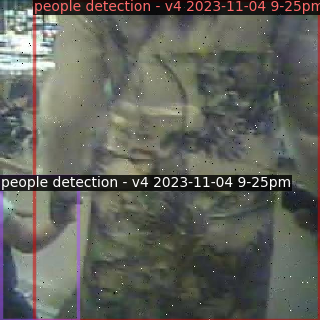

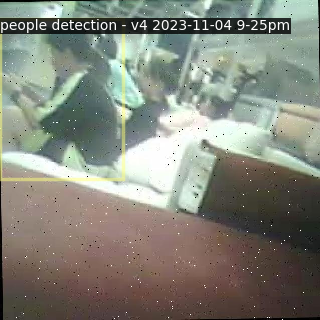

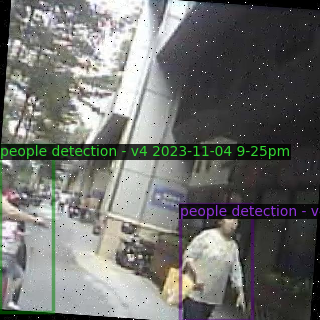

In [5]:
# visualize traing data
my_dataset_train_meatadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer


for d in random.sample(dataset_dicts, 3):
  img = cv2.imread(d["file_name"])
  visualizer = Visualizer(img[:,:,::-1], metadata=my_dataset_train_meatadata, scale=0.5)
  vis = visualizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:,:,::-1])



# Train Custom Detectron2 Detector

In [6]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

cfg = get_cfg()
cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()

cfg.DATALOADER.NUM_WORKERS = 2

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
)

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 200

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()


[01/31 19:29:15 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 179MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[01/31 19:29:16 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
W0131 19:29:19.302000 18804 torch/fx/_symbolic_trace.py:52] is_fx_tracing will return true for both fx.symbolic_trace and torch.export. Please use is_fx_tracing_symbolic_tracing() for specifically fx.symbolic_trace or torch.compiler.is_compiling() for specifically torch.export/compile.


[01/31 19:29:25 d2.utils.events]:  eta: 0:00:53  iter: 19  total_loss: 2.453  loss_cls: 1.73  loss_box_reg: 0.5955  loss_rpn_cls: 0.01502  loss_rpn_loc: 0.009018    time: 0.2866  last_time: 0.2714  data_time: 0.0178  last_data_time: 0.0058   lr: 0.00023976  max_mem: 1736M
[01/31 19:29:37 d2.utils.events]:  eta: 0:00:44  iter: 39  total_loss: 1.124  loss_cls: 0.4768  loss_box_reg: 0.5928  loss_rpn_cls: 0.01218  loss_rpn_loc: 0.009469    time: 0.2818  last_time: 0.2847  data_time: 0.0058  last_data_time: 0.0047   lr: 0.00048951  max_mem: 1736M
[01/31 19:29:43 d2.utils.events]:  eta: 0:00:39  iter: 59  total_loss: 1.012  loss_cls: 0.2816  loss_box_reg: 0.6744  loss_rpn_cls: 0.01603  loss_rpn_loc: 0.007673    time: 0.2860  last_time: 0.2690  data_time: 0.0071  last_data_time: 0.0048   lr: 0.00073926  max_mem: 1738M
[01/31 19:29:48 d2.utils.events]:  eta: 0:00:33  iter: 79  total_loss: 0.675  loss_cls: 0.1796  loss_box_reg: 0.468  loss_rpn_cls: 0.01269  loss_rpn_loc: 0.008319    time: 0.284

In [7]:
# look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# load model and data

In [8]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("my_dataset_test",)
predictor = DefaultPredictor(cfg)

[01/31 19:34:30 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# inference with Detectron2 Saved weights

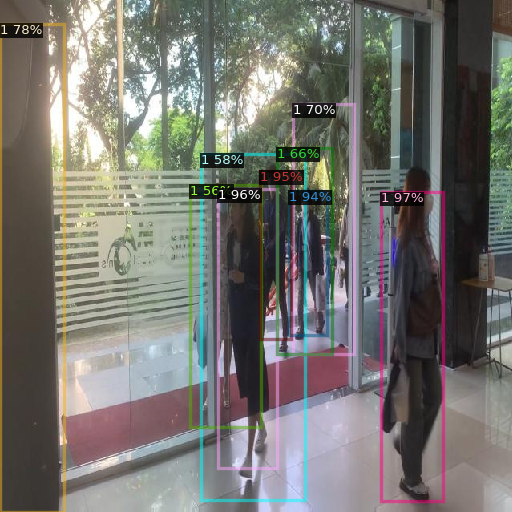

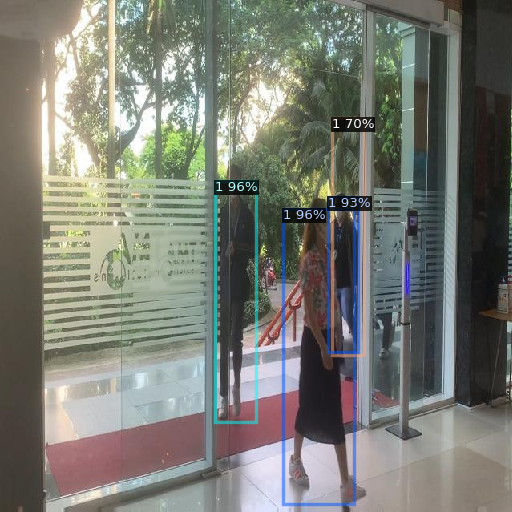

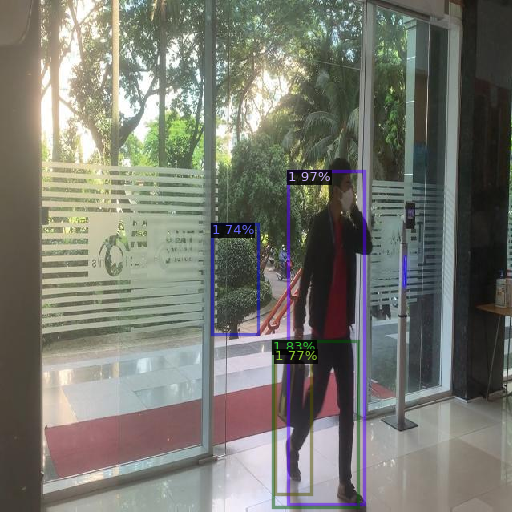

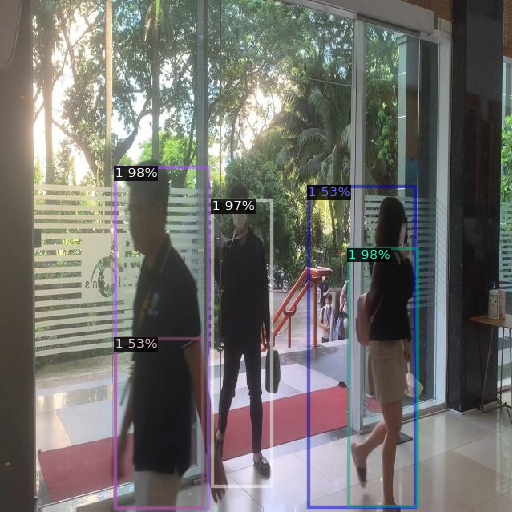

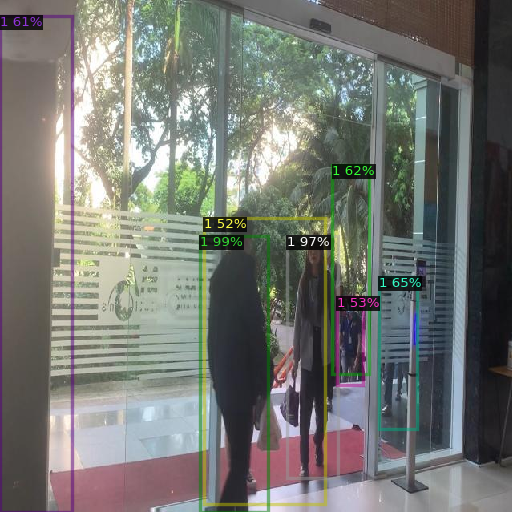

...

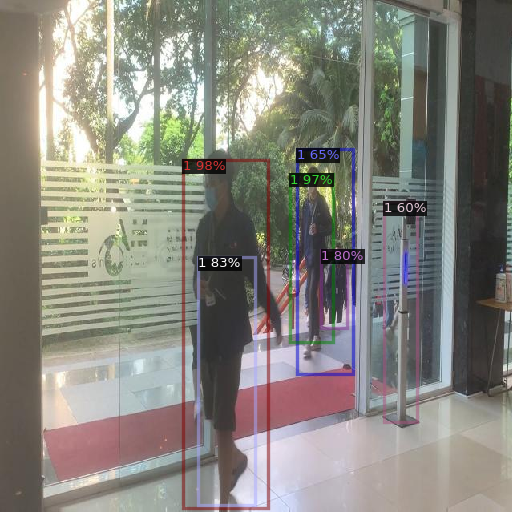

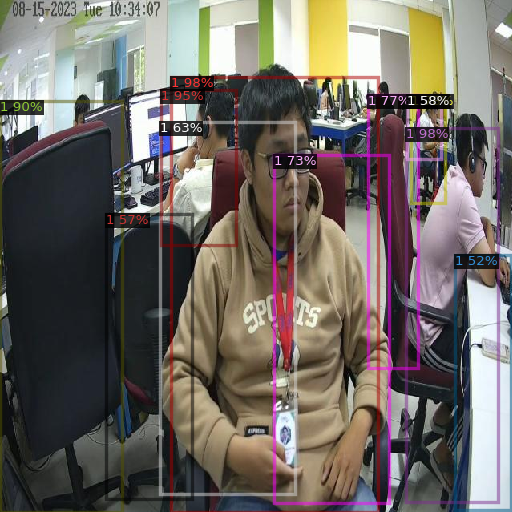

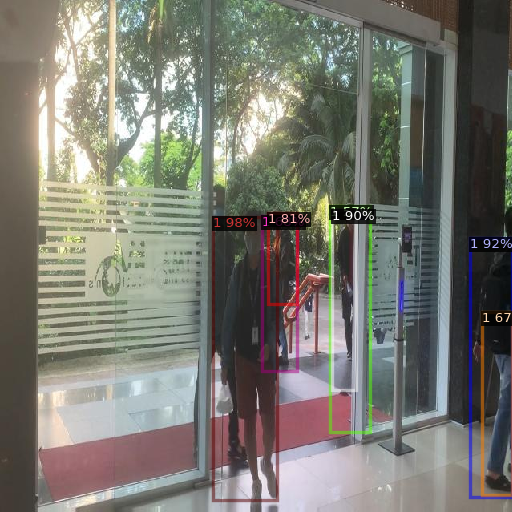

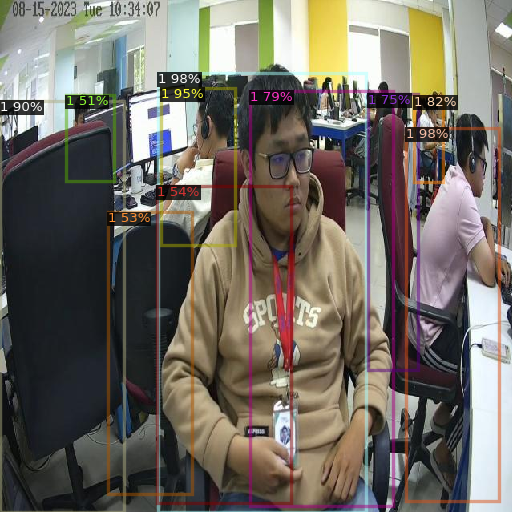

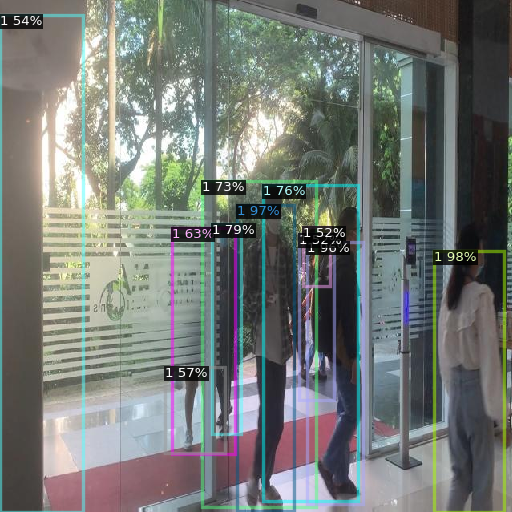

In [9]:
test_metadata = MetadataCatalog.get("my_dataset_test")

from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob("/content/person_detection-1/test/*jpg"):
  img = cv2.imread(imageName)
  outputs = predictor(img)
  v = Visualizer(img[:,:,::-1], metadata=test_metadata, scale=0.8)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:,:,::-1])

In [10]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

WARNING [01/31 19:46:33 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/31 19:46:33 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/31 19:46:33 d2.data.datasets.coco]: Loaded 14 images in COCO format from /content/person_detection-1/test/_annotations.coco.json
[01/31 19:46:33 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |   category    | #instances   |
|:----------:|:-------------|:-------------:|:-------------|
|   people   | 0            | people dete.. | 47           |
|            |              |               |              |
|   total    | 47           |               |              |
[01/31 19:46:33 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='cho

# Save

In [12]:
f = open('config.yml', 'w')
f.write(cfg.dump())
f.close()

